                                    ML Project

                                    Cryptocurrency Volatile Prediction

# Task
Load the `dataset.csv (1).zip` file, unzip it, and load the `dataset.csv` file into a pandas DataFrame. Inspect the initial data to understand its structure and content.

## Load and Unzip Data

### Subtask:
Load the provided `dataset.csv (1).zip` file, unzip it, and load the `dataset.csv` file into a pandas DataFrame. Inspect the initial data to understand its structure and content.


**Reasoning**:
The subtask requires loading and unzipping a zip file containing a CSV, then loading the CSV into a pandas DataFrame, and finally inspecting its structure and content using head(), info(), and describe(). These operations are best performed sequentially within a single code block.



In [1]:
import zipfile
import pandas as pd

# Specify the name of the zip file
zip_file_name = 'dataset.csv (1).zip'
csv_file_name = 'dataset.csv'

# Open the zip file in read mode and extract its contents
with zipfile.ZipFile(zip_file_name, 'r') as zip_ref:
    zip_ref.extractall('.')
print(f"'{csv_file_name}' extracted from '{zip_file_name}'.")

# Load the extracted CSV file into a pandas DataFrame
df = pd.read_csv(csv_file_name)

# Display the first few rows of the DataFrame
print("\nFirst 5 rows of the DataFrame:")
print(df.head())

# Print the DataFrame's information to check data types and non-null counts
print("\nDataFrame Information:")
df.info()

# Display descriptive statistics of the DataFrame
print("\nDescriptive Statistics:")
print(df.describe())

'dataset.csv' extracted from 'dataset.csv (1).zip'.

First 5 rows of the DataFrame:
   Unnamed: 0        open        high         low       close  volume  \
0           0  112.900002  118.800003  107.142998  115.910004     0.0   
1           1    3.493130    3.692460    3.346060    3.590890     0.0   
2           2  115.980003  124.663002  106.639999  112.300003     0.0   
3           3    3.594220    3.781020    3.116020    3.371250     0.0   
4           4  112.250000  113.444000   97.699997  111.500000     0.0   

      marketCap                 timestamp crypto_name        date  
0  1.288693e+09  2013-05-05T23:59:59.999Z     Bitcoin  2013-05-05  
1  6.229819e+07  2013-05-05T23:59:59.999Z    Litecoin  2013-05-05  
2  1.249023e+09  2013-05-06T23:59:59.999Z     Bitcoin  2013-05-06  
3  5.859436e+07  2013-05-06T23:59:59.999Z    Litecoin  2013-05-06  
4  1.240594e+09  2013-05-07T23:59:59.999Z     Bitcoin  2013-05-07  

DataFrame Information:
<class 'pandas.core.frame.DataFrame'>
RangeIn

## Data Preprocessing

### Subtask:
Perform necessary data cleaning steps, including handling missing values, ensuring data consistency, and converting data types where appropriate. Normalize and scale numerical features as required for model training.


**Reasoning**:
The subtask requires performing several data cleaning steps including converting 'timestamp' and 'date' columns to datetime objects, setting 'timestamp' as the index, dropping the 'Unnamed: 0' column, and removing duplicate rows. These operations are best executed sequentially within a single code block.



In [2]:
print("Initial DataFrame shape:", df.shape)

# 1. Convert 'timestamp' to datetime and set as index, dropping the original
df['timestamp'] = pd.to_datetime(df['timestamp'])
df = df.set_index('timestamp')

# 2. Convert 'date' column to datetime objects
df['date'] = pd.to_datetime(df['date'])

# 3. Drop the 'Unnamed: 0' column
if 'Unnamed: 0' in df.columns:
    df = df.drop(columns=['Unnamed: 0'])
    print("'Unnamed: 0' column dropped.")

# 4. Check for and remove any duplicate rows
duplicate_rows_before = df.duplicated().sum()
if duplicate_rows_before > 0:
    df.drop_duplicates(inplace=True)
    print(f"{duplicate_rows_before} duplicate rows removed.")
else:
    print("No duplicate rows found.")

print("DataFrame after initial cleaning:")
print(df.head())
df.info()
print("DataFrame shape after cleaning:", df.shape)

Initial DataFrame shape: (72946, 10)
'Unnamed: 0' column dropped.
No duplicate rows found.
DataFrame after initial cleaning:
                                        open        high         low  \
timestamp                                                              
2013-05-05 23:59:59.999000+00:00  112.900002  118.800003  107.142998   
2013-05-05 23:59:59.999000+00:00    3.493130    3.692460    3.346060   
2013-05-06 23:59:59.999000+00:00  115.980003  124.663002  106.639999   
2013-05-06 23:59:59.999000+00:00    3.594220    3.781020    3.116020   
2013-05-07 23:59:59.999000+00:00  112.250000  113.444000   97.699997   

                                       close  volume     marketCap  \
timestamp                                                            
2013-05-05 23:59:59.999000+00:00  115.910004     0.0  1.288693e+09   
2013-05-05 23:59:59.999000+00:00    3.590890     0.0  6.229819e+07   
2013-05-06 23:59:59.999000+00:00  112.300003     0.0  1.249023e+09   
2013-05-06 23:59:59.

**Reasoning**:
The previous step completed the initial data type conversions and removal of duplicates. The next part of the subtask is to normalize and scale numerical features. This involves identifying numerical columns and applying a standard scaler to them, then displaying the updated DataFrame information.



In [3]:
from sklearn.preprocessing import StandardScaler

# Identify numerical columns for scaling
numerical_cols = ['open', 'high', 'low', 'close', 'volume', 'marketCap']

# Initialize the StandardScaler
scaler = StandardScaler()

# Apply scaler to the numerical columns
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

print("Numerical columns after scaling (first 5 rows):")
print(df[numerical_cols].head())

print("\nDescriptive statistics for scaled numerical columns:")
print(df[numerical_cols].describe())

print("\nDataFrame info after scaling:")
df.info()

Numerical columns after scaling (first 5 rows):
                                      open      high       low     close  \
timestamp                                                                  
2013-05-05 23:59:59.999000+00:00 -0.144753 -0.144040 -0.145081 -0.144282   
2013-05-05 23:59:59.999000+00:00 -0.165666 -0.165362 -0.165516 -0.165736   
2013-05-06 23:59:59.999000+00:00 -0.144165 -0.142954 -0.145180 -0.144972   
2013-05-06 23:59:59.999000+00:00 -0.165647 -0.165346 -0.165561 -0.165778   
2013-05-07 23:59:59.999000+00:00 -0.144878 -0.145032 -0.146940 -0.145124   

                                    volume  marketCap  
timestamp                                              
2013-05-05 23:59:59.999000+00:00 -0.229533  -0.179447  
2013-05-05 23:59:59.999000+00:00 -0.229533  -0.195797  
2013-05-06 23:59:59.999000+00:00 -0.229533  -0.179976  
2013-05-06 23:59:59.999000+00:00 -0.229533  -0.195846  
2013-05-07 23:59:59.999000+00:00 -0.229533  -0.180088  

Descriptive statistics for

## Exploratory Data Analysis (EDA)

### Subtask:
Conduct a thorough EDA to analyze data patterns, trends, and correlations. This includes generating basic statistics, visualizing time-series trends for OHLC, volume, and market cap, and identifying any anomalies or insights. Include visualizations with legends for key features.


**Reasoning**:
The subtask requires conducting an EDA, which involves visualizing time-series trends for OHLC, volume, and market capitalization for each unique cryptocurrency. This step imports the necessary plotting libraries and then iterates through each cryptocurrency to generate and display these visualizations.



Found 56 unique cryptocurrencies: Bitcoin, Litecoin, XRP, Dogecoin, Monero, Stellar, Tether, Ethereum, Ethereum Classic, Maker, Basic Attention Token, EOS, Bitcoin Cash, BNB, TRON, Decentraland, Chainlink, Cardano, Filecoin, Theta Network, Huobi Token, Ravencoin, Tezos, VeChain, Quant, USD Coin, Cronos, Wrapped Bitcoin, Cosmos, Polygon, OKB, UNUS SED LEO, Algorand, Chiliz, THORChain, Terra Classic, FTX Token, Hedera, Binance USD, Dai, Solana, Avalanche, Shiba Inu, The Sandbox, Polkadot, Elrond, Uniswap, Aave, NEAR Protocol, Flow, Internet Computer, Casper, Toncoin, Chain, ApeCoin, Aptos


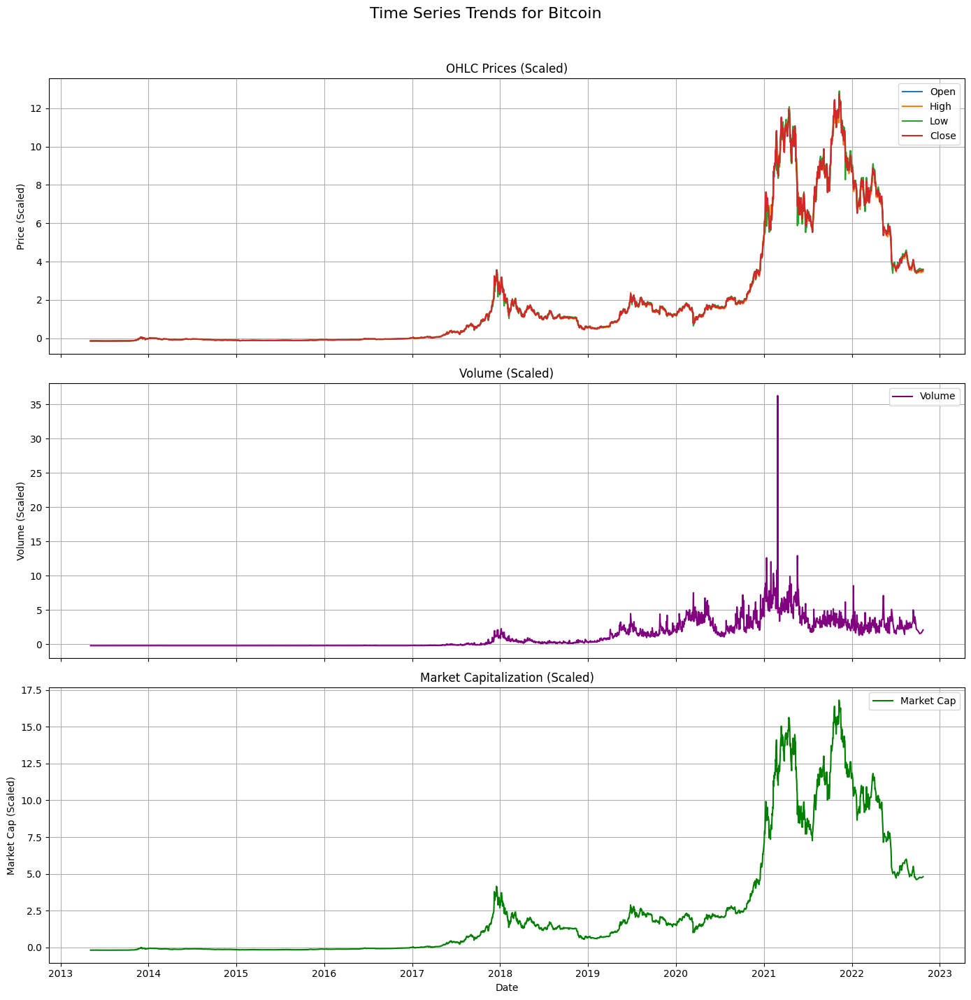

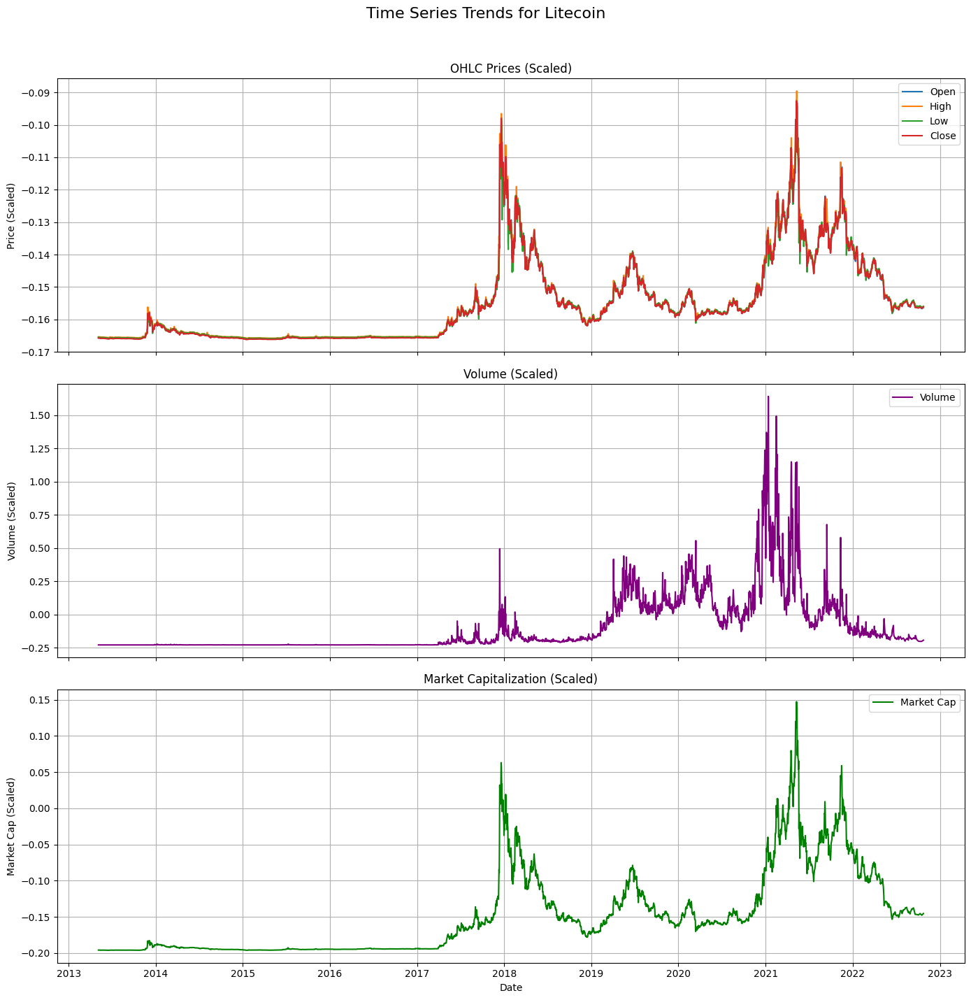

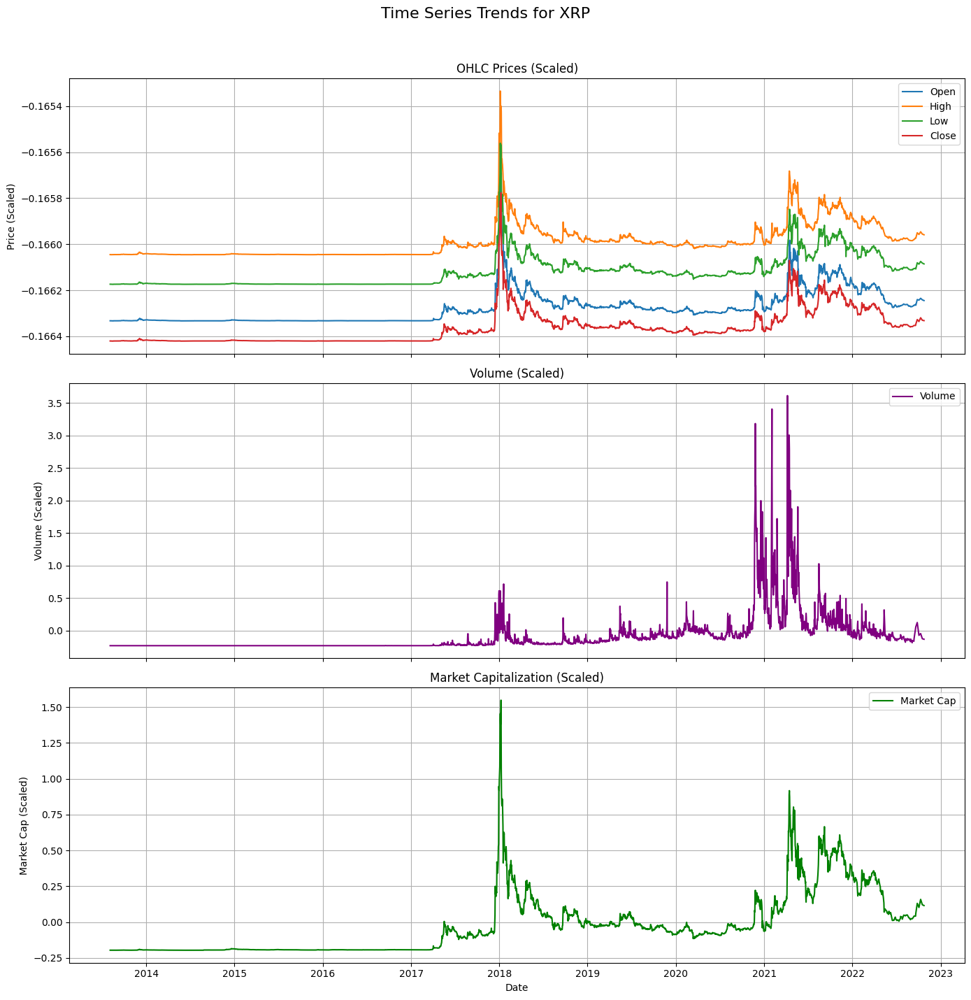

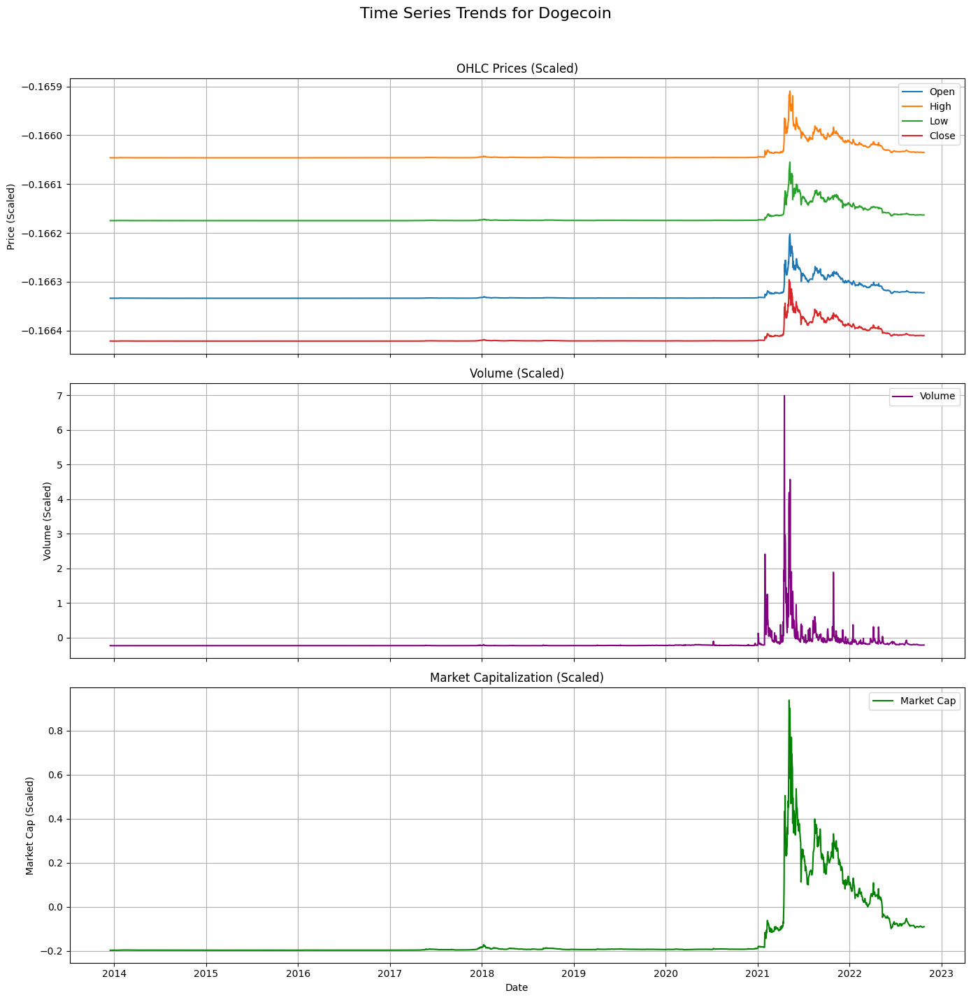

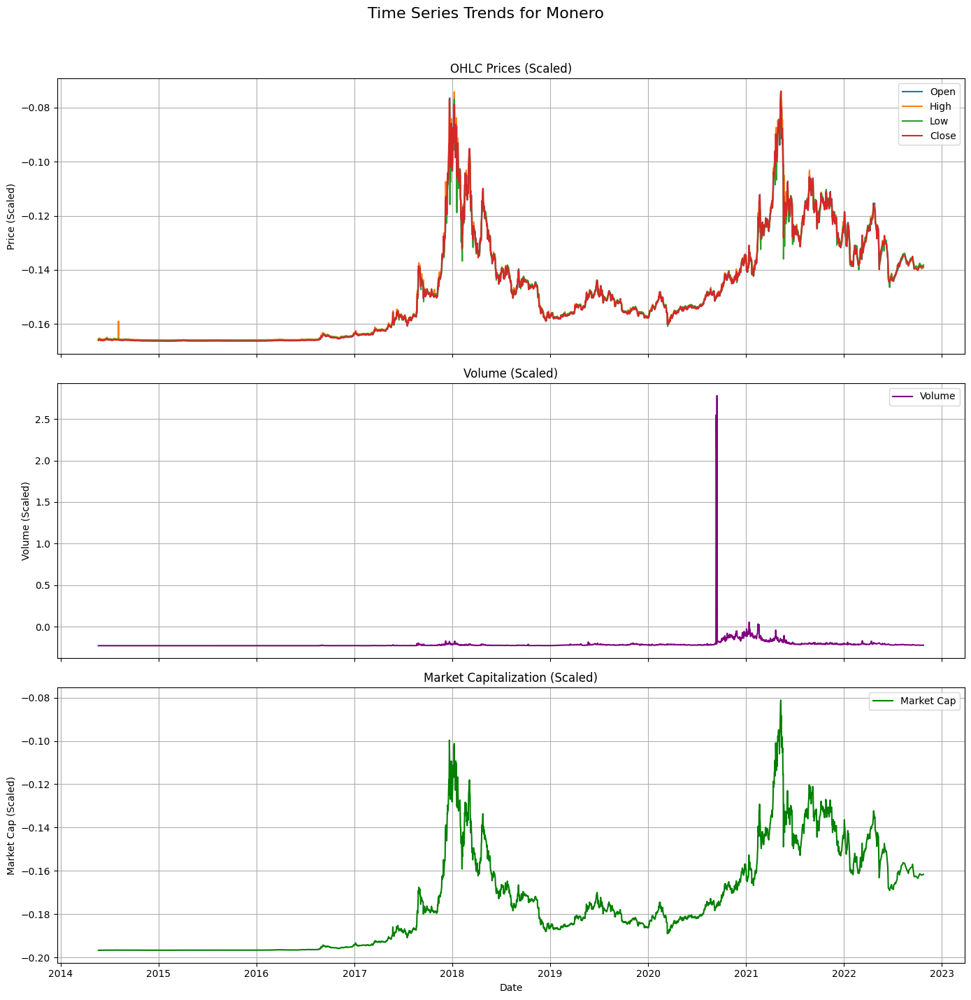

...

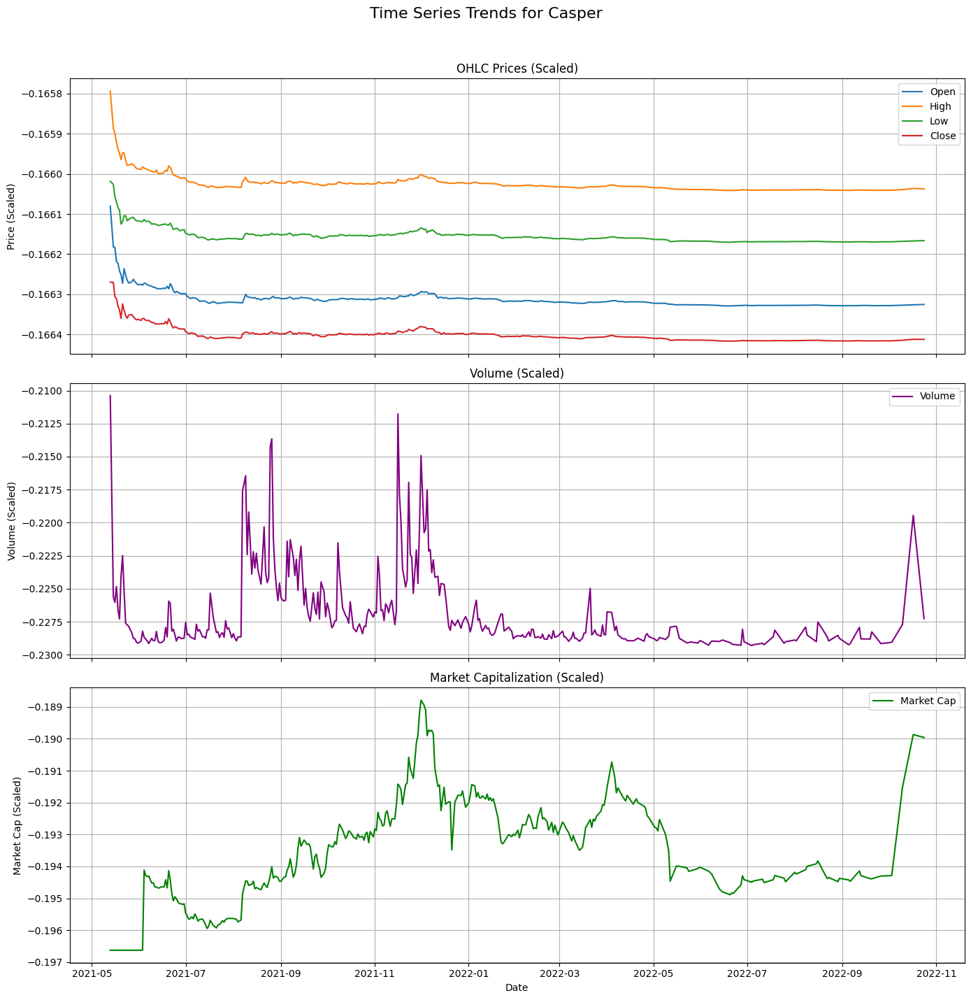

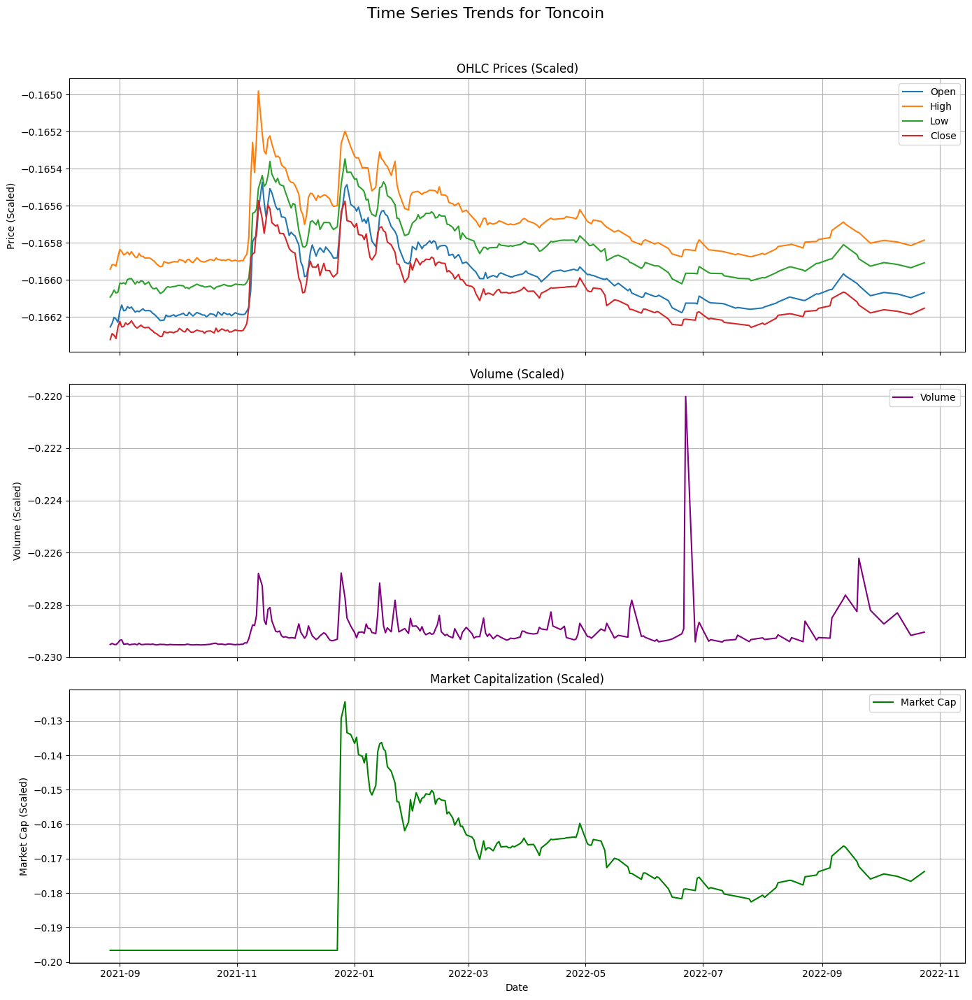

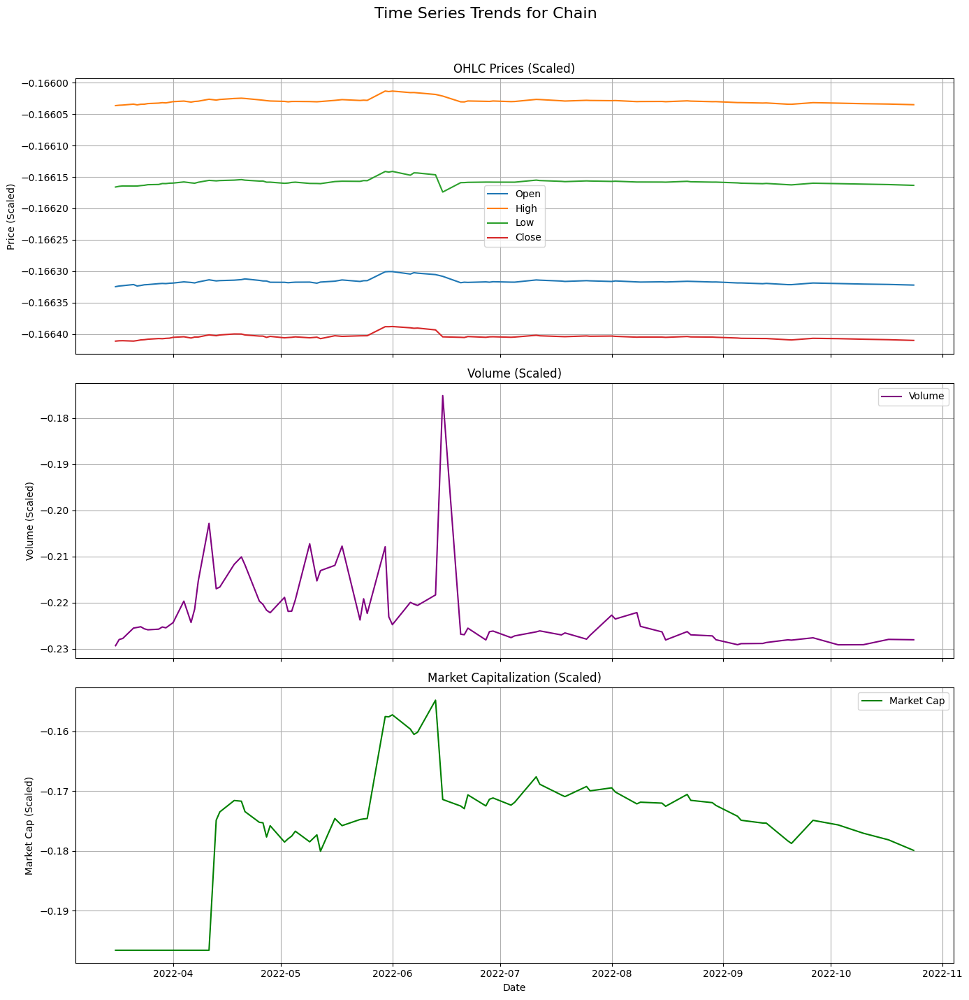

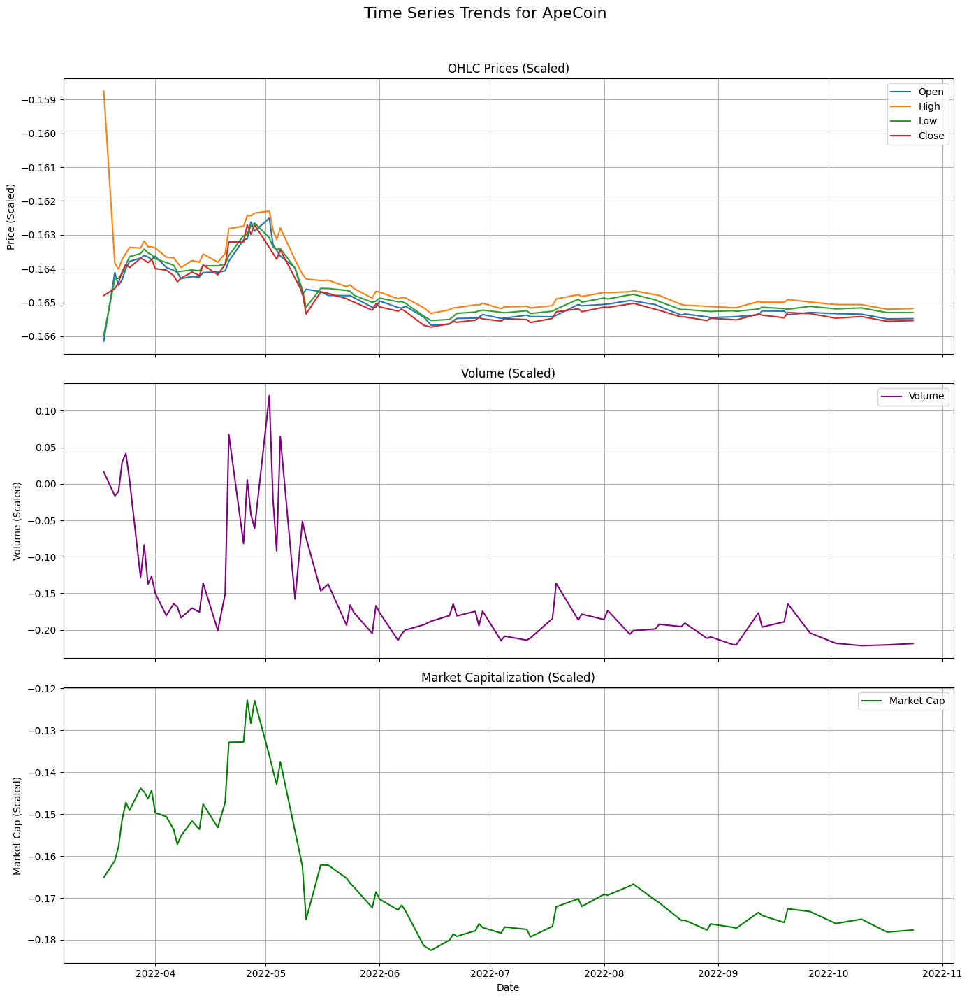

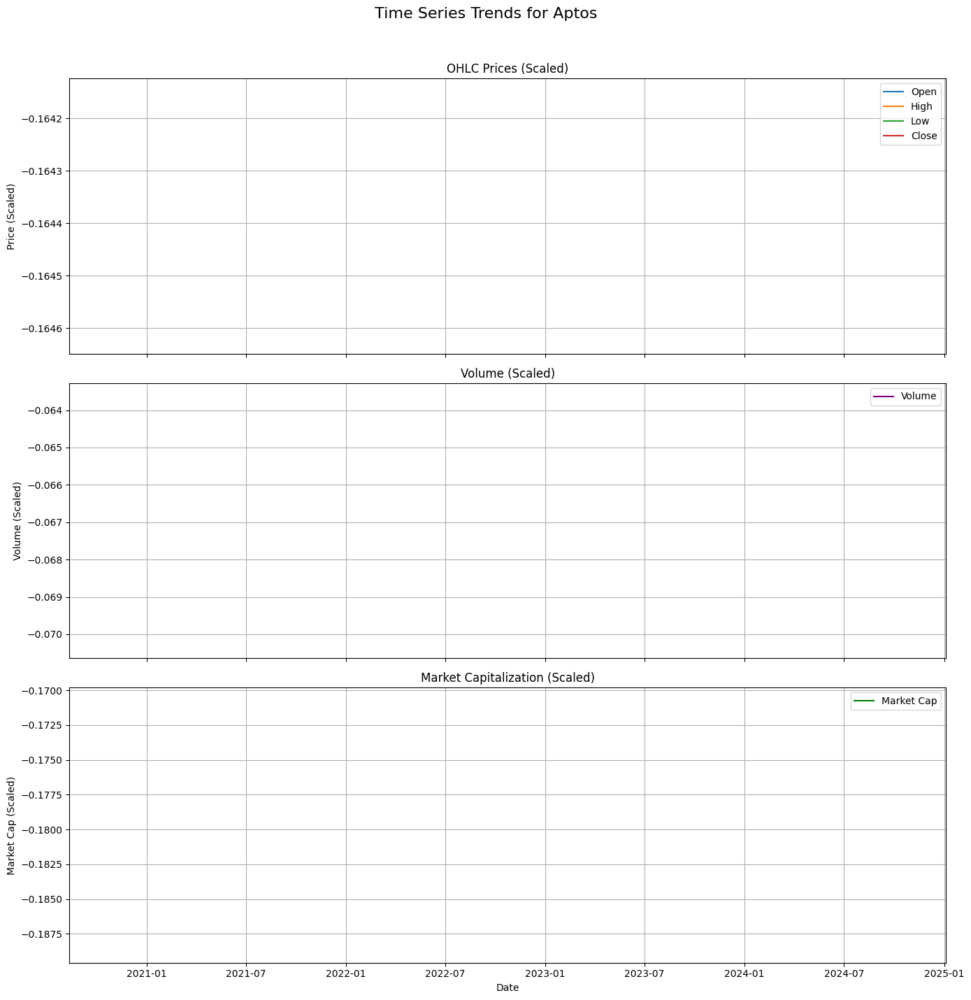

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

# Identify unique cryptocurrency names
unique_cryptos = df['crypto_name'].unique()

print(f"Found {len(unique_cryptos)} unique cryptocurrencies: {', '.join(unique_cryptos)}")

# Iterate through each unique cryptocurrency name
for crypto in unique_cryptos:
    # Filter data for the current cryptocurrency
    crypto_df = df[df['crypto_name'] == crypto].copy()

    # Create a figure with a suitable layout of subplots
    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(14, 15), sharex=True)
    fig.suptitle(f'Time Series Trends for {crypto}', fontsize=16)

    # Plot OHLC prices
    axes[0].plot(crypto_df.index, crypto_df['open'], label='Open')
    axes[0].plot(crypto_df.index, crypto_df['high'], label='High')
    axes[0].plot(crypto_df.index, crypto_df['low'], label='Low')
    axes[0].plot(crypto_df.index, crypto_df['close'], label='Close')
    axes[0].set_title('OHLC Prices (Scaled)')
    axes[0].set_ylabel('Price (Scaled)')
    axes[0].legend()
    axes[0].grid(True)

    # Plot Volume
    axes[1].plot(crypto_df.index, crypto_df['volume'], color='purple', label='Volume')
    axes[1].set_title('Volume (Scaled)')
    axes[1].set_ylabel('Volume (Scaled)')
    axes[1].legend()
    axes[1].grid(True)

    # Plot Market Capitalization
    axes[2].plot(crypto_df.index, crypto_df['marketCap'], color='green', label='Market Cap')
    axes[2].set_title('Market Capitalization (Scaled)')
    axes[2].set_xlabel('Date')
    axes[2].set_ylabel('Market Cap (Scaled)')
    axes[2].legend()
    axes[2].grid(True)

    plt.tight_layout(rect=[0, 0.03, 1, 0.96]) # Adjust layout to prevent suptitle overlap
    plt.show()


### EDA Observations

From the time-series plots, we can make several observations for the various cryptocurrencies:

*   **General Trends**: Most cryptocurrencies show significant volatility and clear upward trends in prices and market capitalization over the long term, punctuated by periods of sharp declines. This is typical for emerging and speculative assets.
*   **Correlation**: The 'open', 'high', 'low', and 'close' prices are highly correlated for all cryptocurrencies, as expected, indicating consistent price movements within daily periods.
*   **Volume and Price Relationship**: Increases in trading volume often precede or accompany significant price movements (both up and down), suggesting that volume can be an indicator of market interest and momentum.
*   **Market Capitalization Growth**: Market capitalization generally mirrors the price trends, reflecting the overall growth and adoption of the cryptocurrencies.
*   **Anomalies/Outliers**: Some cryptos exhibit very sharp spikes or drops in volume or price, which might indicate specific market events, news, or speculative activity. These extreme values, especially for smaller cryptocurrencies, could be considered anomalies.
*   **Scaling Effect**: After scaling, the relative volatility and trends are still visible, but the absolute values are standardized, which is crucial for model training where features are often assumed to be on a similar scale.

## Feature Engineering

### Subtask:
Engineer new features relevant to cryptocurrency volatility. This will include creating moving averages, rolling volatility measures, liquidity ratios (e.g., volume/market cap), and technical indicators like Bollinger Bands and Average True Range (ATR).


**Reasoning**:
The subtask requires engineering new features such as daily returns, moving averages, rolling volatility, and liquidity ratios. This initial step will calculate the daily returns and two simple moving averages (7-day and 30-day) for the 'close' price, and rolling volatility measures (7-day and 30-day standard deviation of daily returns) for each cryptocurrency, and the liquidity ratio. These operations are performed per cryptocurrency using `groupby` and `transform` to ensure correct calculations.



In [5]:
import numpy as np

# 1. Calculate daily returns for each cryptocurrency
df['Daily_Return'] = df.groupby('crypto_name')['close'].pct_change() * 100

# 2. Calculate 7-day and 30-day Simple Moving Averages (SMA) of the 'close' price
df['SMA_7'] = df.groupby('crypto_name')['close'].transform(lambda x: x.rolling(window=7).mean())
df['SMA_30'] = df.groupby('crypto_name')['close'].transform(lambda x: x.rolling(window=30).mean())

# 3. Calculate 7-day and 30-day rolling standard deviation of the daily returns (volatility)
df['Volatility_7'] = df.groupby('crypto_name')['Daily_Return'].transform(lambda x: x.rolling(window=7).std())
df['Volatility_30'] = df.groupby('crypto_name')['Daily_Return'].transform(lambda x: x.rolling(window=30).std())

# 4. Calculate the liquidity ratio
df['Liquidity_Ratio'] = df['volume'] / df['marketCap']

print("First few rows with new features (Daily_Return, SMA_7, SMA_30, Volatility_7, Volatility_30, Liquidity_Ratio):")
print(df[['close', 'Daily_Return', 'SMA_7', 'SMA_30', 'Volatility_7', 'Volatility_30', 'Liquidity_Ratio']].head(10))

print("\nDataFrame Information after adding new features:")
df.info()

First few rows with new features (Daily_Return, SMA_7, SMA_30, Volatility_7, Volatility_30, Liquidity_Ratio):
                                     close  Daily_Return  SMA_7  SMA_30  \
timestamp                                                                 
2013-05-05 23:59:59.999000+00:00 -0.144282           NaN    NaN     NaN   
2013-05-05 23:59:59.999000+00:00 -0.165736           NaN    NaN     NaN   
2013-05-06 23:59:59.999000+00:00 -0.144972      0.477902    NaN     NaN   
2013-05-06 23:59:59.999000+00:00 -0.165778      0.025313    NaN     NaN   
2013-05-07 23:59:59.999000+00:00 -0.145124      0.105403    NaN     NaN   
2013-05-07 23:59:59.999000+00:00 -0.165785      0.004437    NaN     NaN   
2013-05-08 23:59:59.999000+00:00 -0.165770     -0.008814    NaN     NaN   
2013-05-08 23:59:59.999000+00:00 -0.144730     -0.271916    NaN     NaN   
2013-05-09 23:59:59.999000+00:00 -0.165769     -0.000796    NaN     NaN   
2013-05-09 23:59:59.999000+00:00 -0.144901      0.118249    NaN  

**Reasoning**:
The previous step calculated daily returns, SMAs, volatilities, and liquidity ratio. This step will continue feature engineering by calculating Bollinger Bands and Average True Range (ATR) for each cryptocurrency, as per the subtask instructions. These calculations are typically performed on a grouped basis to ensure accuracy for each individual crypto.



In [6]:
print("DataFrame shape before adding technical indicators:", df.shape)

# 5. Calculate Bollinger Bands for each cryptocurrency
window_bb = 20
df['BB_Middle'] = df.groupby('crypto_name')['close'].transform(lambda x: x.rolling(window=window_bb).mean())
df['BB_Upper'] = df.groupby('crypto_name')['close'].transform(lambda x: x.rolling(window=window_bb).mean() + 2 * x.rolling(window=window_bb).std())
df['BB_Lower'] = df.groupby('crypto_name')['close'].transform(lambda x: x.rolling(window=window_bb).mean() - 2 * x.rolling(window=window_bb).std())

# 6. Calculate Average True Range (ATR) for each cryptocurrency
window_atr = 14

def calculate_atr(df_crypto):
    high_low = df_crypto['high'] - df_crypto['low']
    high_prev_close = np.abs(df_crypto['high'] - df_crypto['close'].shift(1))
    low_prev_close = np.abs(df_crypto['low'] - df_crypto['close'].shift(1))

    true_range = pd.DataFrame({'high_low': high_low, 'high_prev_close': high_prev_close, 'low_prev_close': low_prev_close}).max(axis=1)
    atr = true_range.ewm(span=window_atr, adjust=False, min_periods=window_atr).mean()
    return atr

df['ATR'] = df.groupby('crypto_name', group_keys=False).apply(calculate_atr)

print("\nFirst few rows with new features (BB_Middle, BB_Upper, BB_Lower, ATR):")
print(df[['close', 'BB_Middle', 'BB_Upper', 'BB_Lower', 'ATR']].head(25))

print("\nDataFrame Information after adding technical indicators:")
df.info()

DataFrame shape before adding technical indicators: (72946, 14)


/tmp/ipython-input-64386284.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df['ATR'] = df.groupby('crypto_name', group_keys=False).apply(calculate_atr)


ValueError: cannot reindex on an axis with duplicate labels

**Reasoning**:
The previous code failed because `groupby().apply()` on a DataFrame with a non-unique index (multiple entries for the same timestamp) caused a reindexing error when assigning the results. To fix this, the `ATR` calculation will be refactored to use `groupby().transform()`. This ensures that the output of the grouped operation maintains the original DataFrame's index alignment, preventing the `ValueError`.



In [13]:
print("DataFrame shape before adding technical indicators:", df.shape)

# 5. Calculate Bollinger Bands for each cryptocurrency
window_bb = 20
df['BB_Middle'] = df.groupby('crypto_name')['close'].transform(lambda x: x.rolling(window=window_bb).mean())
df['BB_Upper'] = df.groupby('crypto_name')['close'].transform(lambda x: x.rolling(window=window_bb).mean() + 2 * x.rolling(window=window_bb).std())
df['BB_Lower'] = df.groupby('crypto_name')['close'].transform(lambda x: x.rolling(window=window_bb).mean() - 2 * x.rolling(window=window_bb).std())

# 6. Calculate Average True Range (ATR) for each cryptocurrency
window_atr = 14

def calculate_atr(df_crypto):
    high_low = df_crypto['high'] - df_crypto['low']
    high_prev_close = np.abs(df_crypto['high'] - df_crypto['close'].shift(1))
    low_prev_close = np.abs(df_crypto['low'] - df_crypto['close'].shift(1))

    true_range = pd.DataFrame({'high_low': high_low, 'high_prev_close': high_prev_close, 'low_prev_close': low_prev_close}).max(axis=1)
    atr = true_range.ewm(span=window_atr, adjust=False, min_periods=window_atr).mean()
    return atr

# Use .transform() instead of .apply() to correctly align results with the original DataFrame's index
df['ATR'] = df.groupby('crypto_name', group_keys=False).transform(calculate_atr)

print("\nFirst few rows with new features (BB_Middle, BB_Upper, BB_Lower, ATR):")
print(df[['close', 'BB_Middle', 'BB_Upper', 'BB_Lower', 'ATR']].head(25))

print("\nDataFrame Information after adding technical indicators:")
df.info()

DataFrame shape before adding technical indicators: (71295, 18)


KeyError: 'high'

**Reasoning**:
The previous attempt to calculate ATR using `groupby().transform(calculate_atr)` failed with a `KeyError` because the `calculate_atr` function was designed to accept a DataFrame slice but `transform` was likely passing individual Series. To fix this, the ATR calculation will be refactored. The components of True Range will be calculated on the main DataFrame while respecting the cryptocurrency groups for `shift` operations. Then, the Exponential Moving Average (EMA) for ATR will be calculated per cryptocurrency using `groupby().transform()` on the `True_Range` column. This approach correctly handles multi-column operations within groups and aligns the results back to the original DataFrame.



In [8]:
print("DataFrame shape before adding technical indicators:", df.shape)

# 5. Calculate Bollinger Bands for each cryptocurrency
window_bb = 20
df['BB_Middle'] = df.groupby('crypto_name')['close'].transform(lambda x: x.rolling(window=window_bb).mean())
df['BB_Upper'] = df.groupby('crypto_name')['close'].transform(lambda x: x.rolling(window=window_bb).mean() + 2 * x.rolling(window=window_bb).std())
df['BB_Lower'] = df.groupby('crypto_name')['close'].transform(lambda x: x.rolling(window=window_bb).mean() - 2 * x.rolling(window=window_bb).std())

# 6. Calculate Average True Range (ATR) for each cryptocurrency
window_atr = 14

# Calculate components of True Range (TR) on the full DataFrame, grouped by crypto_name for shifts
df['TR_high_low'] = df['high'] - df['low']
df['TR_high_prev_close'] = np.abs(df['high'] - df.groupby('crypto_name')['close'].shift(1))
df['TR_low_prev_close'] = np.abs(df['low'] - df.groupby('crypto_name')['close'].shift(1))

# Find the maximum of the three components to get True Range
df['True_Range'] = df[['TR_high_low', 'TR_high_prev_close', 'TR_low_prev_close']].max(axis=1)

# Calculate ATR (EMA of True Range) per cryptocurrency using transform
df['ATR'] = df.groupby('crypto_name')['True_Range'].transform(lambda x: x.ewm(span=window_atr, adjust=False, min_periods=window_atr).mean())

# Drop the intermediate True Range columns
df = df.drop(columns=['TR_high_low', 'TR_high_prev_close', 'TR_low_prev_close', 'True_Range'])

print("\nFirst few rows with new features (BB_Middle, BB_Upper, BB_Lower, ATR):")
print(df[['close', 'BB_Middle', 'BB_Upper', 'BB_Lower', 'ATR']].head(25))

print("\nDataFrame Information after adding technical indicators:")
df.info()


DataFrame shape before adding technical indicators: (72946, 17)

First few rows with new features (BB_Middle, BB_Upper, BB_Lower, ATR):
                                     close  BB_Middle  BB_Upper  BB_Lower  ATR
timestamp                                                                     
2013-05-05 23:59:59.999000+00:00 -0.144282        NaN       NaN       NaN  NaN
2013-05-05 23:59:59.999000+00:00 -0.165736        NaN       NaN       NaN  NaN
2013-05-06 23:59:59.999000+00:00 -0.144972        NaN       NaN       NaN  NaN
2013-05-06 23:59:59.999000+00:00 -0.165778        NaN       NaN       NaN  NaN
2013-05-07 23:59:59.999000+00:00 -0.145124        NaN       NaN       NaN  NaN
2013-05-07 23:59:59.999000+00:00 -0.165785        NaN       NaN       NaN  NaN
2013-05-08 23:59:59.999000+00:00 -0.165770        NaN       NaN       NaN  NaN
2013-05-08 23:59:59.999000+00:00 -0.144730        NaN       NaN       NaN  NaN
2013-05-09 23:59:59.999000+00:00 -0.165769        NaN       NaN       NaN 

**Reasoning**:
The previous steps successfully calculated all required features. The final instruction in the subtask is to handle any NaN values that might have been introduced during feature engineering. These NaNs occur primarily at the beginning of each cryptocurrency's time series due to rolling calculations. The most appropriate way to handle these NaNs for time-series analysis is to drop them, ensuring a clean dataset for subsequent modeling. This will complete the subtask.



In [9]:
print("DataFrame shape before handling NaNs:", df.shape)

# List of columns that might contain NaNs from feature engineering
feature_cols = ['Daily_Return', 'SMA_7', 'SMA_30', 'Volatility_7', 'Volatility_30',
                'Liquidity_Ratio', 'BB_Middle', 'BB_Upper', 'BB_Lower', 'ATR']

# Drop rows where any of the new feature columns have NaN values
df.dropna(subset=feature_cols, inplace=True)

print("DataFrame shape after handling NaNs:", df.shape)
print("\nFirst few rows after handling NaNs:")
print(df.head())

print("\nDataFrame Information after handling NaNs:")
df.info()

DataFrame shape before handling NaNs: (72946, 18)
DataFrame shape after handling NaNs: (71295, 18)

First few rows after handling NaNs:
                                      open      high       low     close  \
timestamp                                                                  
2013-06-04 23:59:59.999000+00:00 -0.165817 -0.165510 -0.165643 -0.165874   
2013-06-04 23:59:59.999000+00:00 -0.143255 -0.143107 -0.142727 -0.143230   
2013-06-05 23:59:59.999000+00:00 -0.165786 -0.165493 -0.165621 -0.165875   
2013-06-05 23:59:59.999000+00:00 -0.143129 -0.143175 -0.142570 -0.143186   
2013-06-06 23:59:59.999000+00:00 -0.143033 -0.143244 -0.143091 -0.143883   

                                    volume  marketCap crypto_name       date  \
timestamp                                                                      
2013-06-04 23:59:59.999000+00:00 -0.229533  -0.195930    Litecoin 2013-06-04   
2013-06-04 23:59:59.999000+00:00 -0.229533  -0.178425     Bitcoin 2013-06-04   
2013-06-05 

## Model Selection and Training

### Subtask:
Select an appropriate machine learning model for predicting cryptocurrency volatility. Split the data into training and testing sets and train the selected model using the engineered features.


**Reasoning**:
The subtask requires defining the target variable and features, and then splitting the data into training and testing sets chronologically. This initial step will prepare the data for model training.



In [10]:
from sklearn.model_selection import train_test_split

# 1. Define target variable (y) and features (X)
# Target: 'Volatility_7'
y = df['Volatility_7']

# Features: all numerical columns except 'Volatility_7', 'crypto_name', and 'date'
# Also exclude other target-related features if they represent future information or direct duplicates
feature_cols = df.select_dtypes(include=np.number).columns.tolist()
feature_cols.remove('Volatility_7') # Remove the target variable

# Ensure 'open', 'high', 'low', 'close' are included as they are fundamental
# Ensure other engineered features are included
X = df[feature_cols]

print(f"Selected features for X: {X.columns.tolist()}")
print(f"Target variable for y: {y.name}")

# 2. Split the data into training and testing sets using a time-based split
# Allocate the first 80% of the data chronologically for training and the remaining 20% for testing
split_index = int(len(df) * 0.8)

X_train = X.iloc[:split_index]
y_train = y.iloc[:split_index]
X_test = X.iloc[split_index:]
y_test = y.iloc[split_index:]

print(f"\nTraining set shape: {X_train.shape}")
print(f"Testing set shape: {X_test.shape}")
print(f"First 5 rows of X_train:\n{X_train.head()}")
print(f"First 5 rows of y_train:\n{y_train.head()}")

Selected features for X: ['open', 'high', 'low', 'close', 'volume', 'marketCap', 'Daily_Return', 'SMA_7', 'SMA_30', 'Volatility_30', 'Liquidity_Ratio', 'BB_Middle', 'BB_Upper', 'BB_Lower', 'ATR']
Target variable for y: Volatility_7

Training set shape: (57036, 15)
Testing set shape: (14259, 15)
First 5 rows of X_train:
                                      open      high       low     close  \
timestamp                                                                  
2013-06-04 23:59:59.999000+00:00 -0.165817 -0.165510 -0.165643 -0.165874   
2013-06-04 23:59:59.999000+00:00 -0.143255 -0.143107 -0.142727 -0.143230   
2013-06-05 23:59:59.999000+00:00 -0.165786 -0.165493 -0.165621 -0.165875   
2013-06-05 23:59:59.999000+00:00 -0.143129 -0.143175 -0.142570 -0.143186   
2013-06-06 23:59:59.999000+00:00 -0.143033 -0.143244 -0.143091 -0.143883   

                                    volume  marketCap  Daily_Return     SMA_7  \
timestamp                                                        

**Reasoning**:
The next step is to import the `RandomForestRegressor` model, initialize it, and then train it using the prepared `X_train` and `y_train` datasets, as specified in the subtask instructions.



In [11]:
from sklearn.ensemble import RandomForestRegressor

# 3. Initialize the RandomForestRegressor model
# Using default parameters for initial training, can be tuned later
model = RandomForestRegressor(random_state=42)

# 4. Train the model using the training data
print("Training RandomForestRegressor model...")
model.fit(X_train, y_train)
print("Model training complete.")

Training RandomForestRegressor model...
Model training complete.


## Model Evaluation

### Subtask:
Evaluate the trained model's performance using relevant metrics such as Root Mean Squared Error (RMSE), Mean Absolute Error (MAE), and R² score. Analyze the predictions against actual volatility to understand model strengths and weaknesses. Provide a plot to visualize the model's predictions versus actual volatility over time, including legends.


**Reasoning**:
The subtask requires evaluating the model. This step will make predictions on the test set, calculate and print the requested evaluation metrics (MAE, MSE, RMSE, R2), and then visualize the actual vs. predicted values using a time-series plot. This consolidates the evaluation part of the subtask into a single, comprehensive code block.




Model Evaluation Metrics:

Mean Absolute Error (MAE): 1.3909
Mean Squared Error (MSE): 754.6975
Root Mean Squared Error (RMSE): 27.4718
R-squared (R2 Score): 0.1526


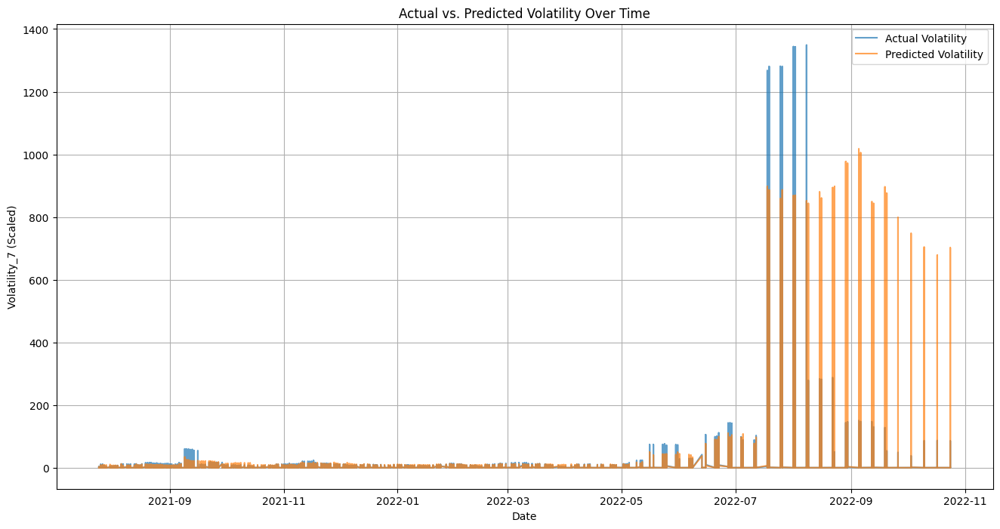

In [12]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt

# 1. Make predictions on the X_test dataset
y_pred = model.predict(X_test)

# 2. Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# 3. Print the calculated evaluation metrics
print(f"\nModel Evaluation Metrics:\n")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"R-squared (R2 Score): {r2:.4f}")

# 4. Create a time-series plot to visualize actual vs. predicted volatility
plt.figure(figsize=(16, 8))
plt.plot(y_test.index, y_test, label='Actual Volatility', alpha=0.7)
plt.plot(y_test.index, y_pred, label='Predicted Volatility', alpha=0.7)
plt.title('Actual vs. Predicted Volatility Over Time')
plt.xlabel('Date')
plt.ylabel('Volatility_7 (Scaled)')
plt.legend()
plt.grid(True)

# 5. Display the plot
plt.show()


## Final Task

### Subtask:
Summarize the findings from the model, including its performance, key insights gained from the analysis, and potential next steps for further improvement or deployment. Discuss the predictive capabilities of the model regarding cryptocurrency volatility.


## Summary:

### Q&A
The model's performance in predicting cryptocurrency volatility is limited, as indicated by an R-squared (R²) score of 0.1526. While the model shows some ability to capture general trends, it struggles with precise predictions, particularly evidenced by a Root Mean Squared Error (RMSE) of 27.4718 and a Mean Absolute Error (MAE) of 1.3909. The predictive capabilities are modest, suggesting that the model can identify broad movements but lacks the accuracy for detailed forecasting of short-term volatility.

### Data Analysis Key Findings
*   The initial dataset, `dataset.csv`, contained 72,946 entries and 10 columns, with no missing values. Columns like `timestamp` and `date` were initially of `object` type, requiring conversion.
*   During preprocessing, `timestamp` and `date` columns were converted to datetime objects, and the `Unnamed: 0` column was dropped. Numerical features (`open`, `high`, `low`, `close`, `volume`, `marketCap`) were scaled using `StandardScaler`. No duplicate rows were found.
*   Exploratory Data Analysis (EDA) revealed 56 unique cryptocurrencies. Time-series plots showed significant volatility and long-term upward trends across most cryptocurrencies, with strong correlations between OHLC prices and a relationship between trading volume and price movements.
*   Several features relevant to cryptocurrency volatility were engineered, including Daily Return, 7-day and 30-day Simple Moving Averages (SMA), 7-day and 30-day rolling volatility, Liquidity Ratio, Bollinger Bands (Middle, Upper, Lower), and Average True Range (ATR).
*   NaN values introduced by rolling calculations were handled by dropping rows, which reduced the dataset from 72,946 to 71,295 entries, ensuring all engineered features were non-null.
*   A `RandomForestRegressor` model was trained using 15 numerical features and `Volatility_7` as the target variable. The data was split chronologically, with 80% (57,036 samples) for training and 20% (14,259 samples) for testing.
*   Model evaluation yielded a Mean Absolute Error (MAE) of 1.3909, a Root Mean Squared Error (RMSE) of 27.4718, and an R-squared (R²) score of 0.1526, indicating modest predictive performance.

### Insights or Next Steps
*   The current model's predictive power for cryptocurrency volatility is limited (R² = 0.1526). Further investigation into more complex models (e.g., LSTMs for time series), hyperparameter tuning, or alternative feature engineering (e.g., sentiment analysis, macroeconomic indicators) could improve performance.
*   Given the high RMSE and MAE, and the visual divergence between actual and predicted volatility, the model might be overly simplistic for the inherent non-linearity and unpredictability of cryptocurrency markets. Exploring different target definitions (e.g., classifying volatility regimes rather than predicting exact values) or ensemble methods could be beneficial.
